In [1]:
import pickle
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from evaluation_util import plot, evaluate_on_dataset, perf_df

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/lightning_utilities/core/imports.py:14: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources
/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/lightning_fabric/__init__.py:40: Deprecated call to `pkg_resources.declare_namespace('lightning_fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/pytorch_lightning/__init__.py:37: Deprecated call to `pkg_resources.declare_namespace('pytorch_lightning')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/r

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
dss_path = '/lustre/scratch/users/yuge.ji/metrics_revisions2'  # directory generated with most random states

In [5]:
performances = {}

## simulated

In [6]:
%%time
with open(f'{dss_path}/sim_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 3.31 ms, sys: 5.16 ms, total: 8.47 ms
Wall time: 21.3 ms


In [7]:
# get metadata
sim_path = './data/sim_files/sim_files/splatter_sim'
params = pd.read_csv(f'{sim_path}/splatter_sim_params.csv').reset_index()
params['perturbation'] = [f'Path{x}' for x in params['index'].values]
params.perturbation.replace({'Path1': 'control'}, inplace=True)

def annotate(df):
    # annotate
    for col in params.columns:
        df[col] = df['perturbation'].map(dict(zip(params.perturbation, params[col])))
    df = df.dropna()  # dropping fake controls

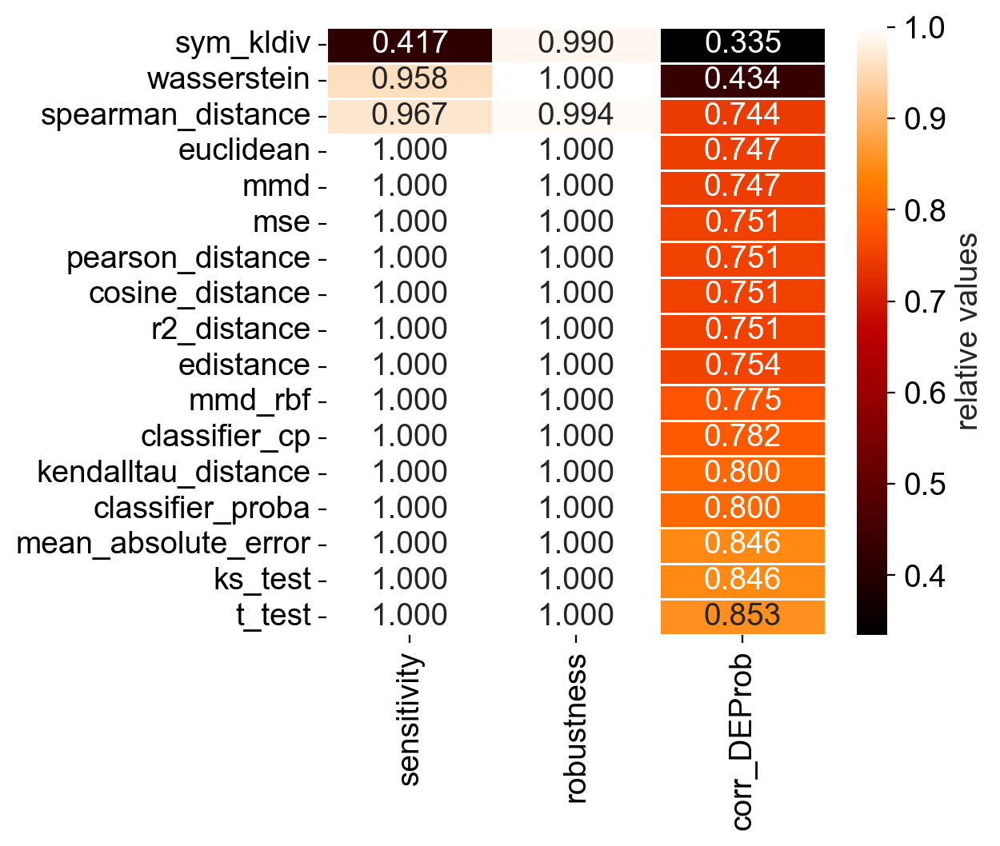

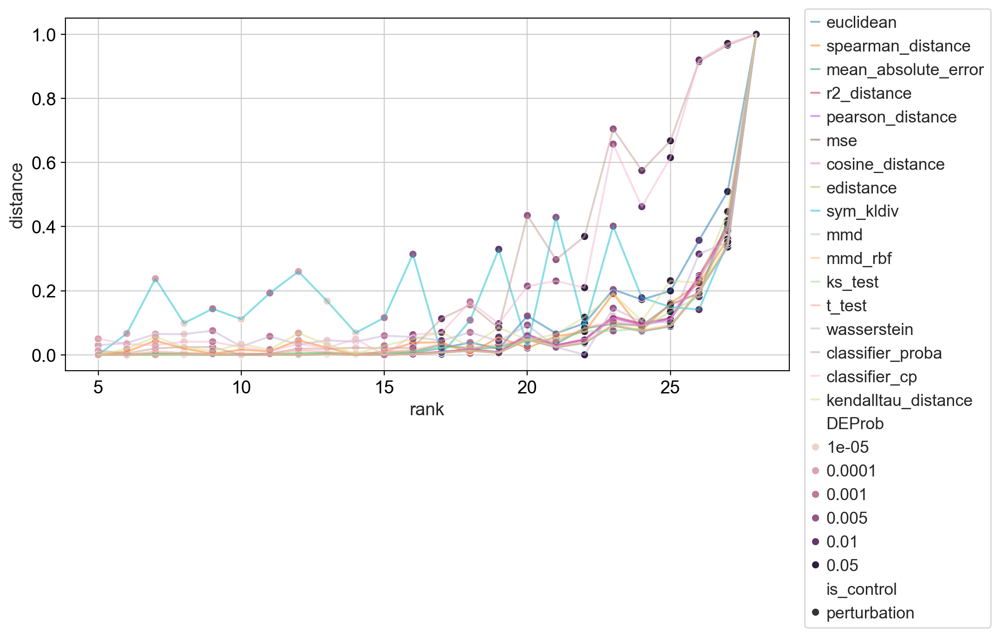

In [8]:
performances['simulated'] = evaluate_on_dataset(results, annotate, 'DEProb', 'ks_test')

## garcia

In [9]:
%%time
with open(f'{dss_path}/garcia_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 9.8 ms, sys: 847 µs, total: 10.6 ms
Wall time: 36.8 ms


In [10]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['pcw'] = [float(p) if 'control' not in p else 8.6 for p in df.perturbation]

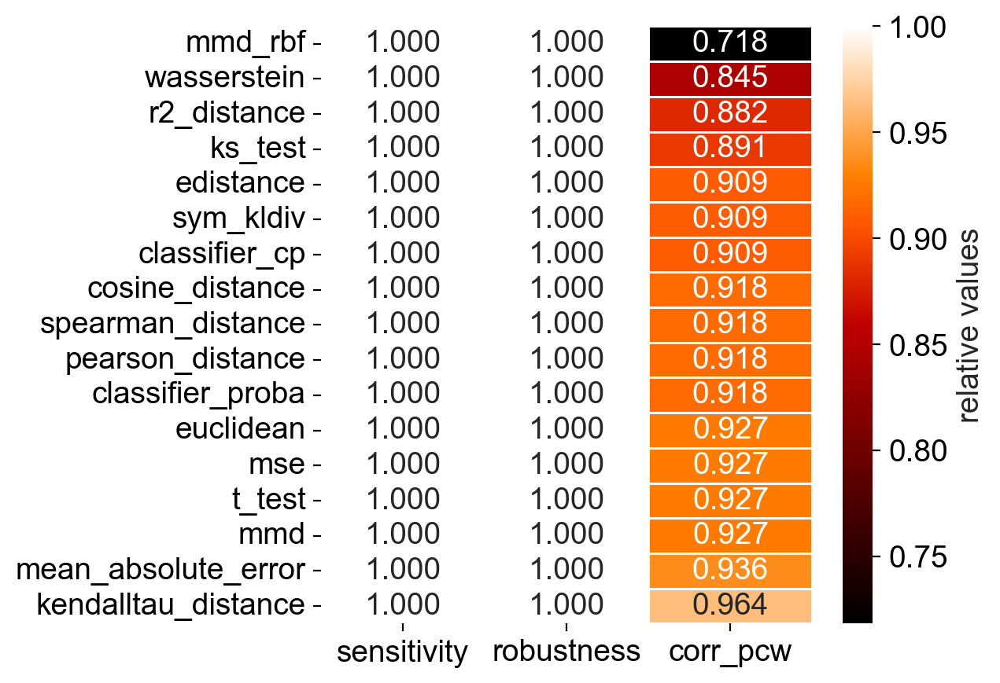

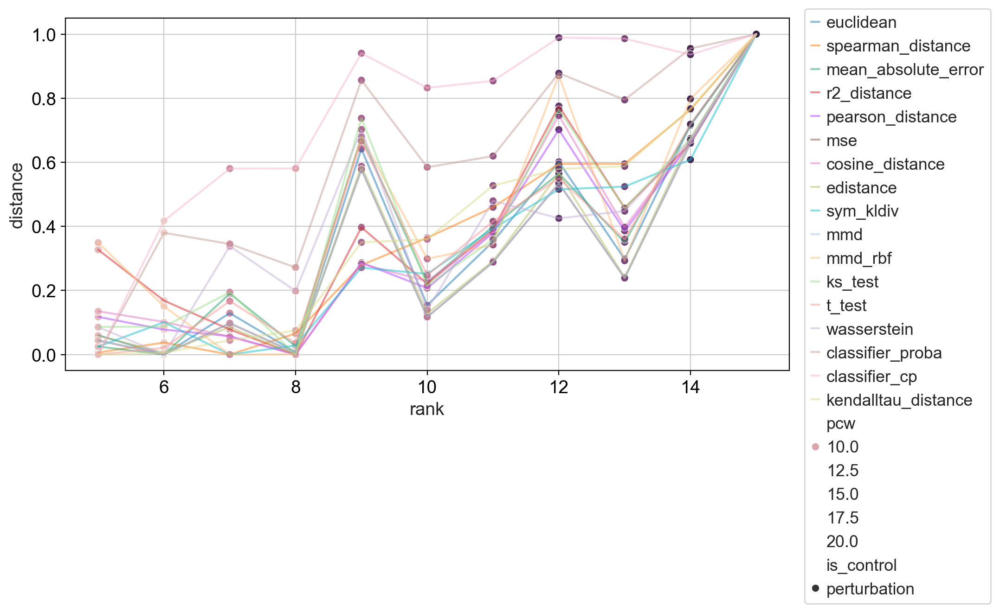

In [11]:
performances['garcia'] = evaluate_on_dataset(results, annotate, 'pcw', 'kendalltau_distance')

## schiebinger

In [12]:
%%time
with open(f'{dss_path}/schiebinger_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 6.37 ms, sys: 1.23 ms, total: 7.6 ms
Wall time: 6.87 ms


In [13]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['day'] = [float(p[1:]) if 'D' in p else 0 for p in df.perturbation]

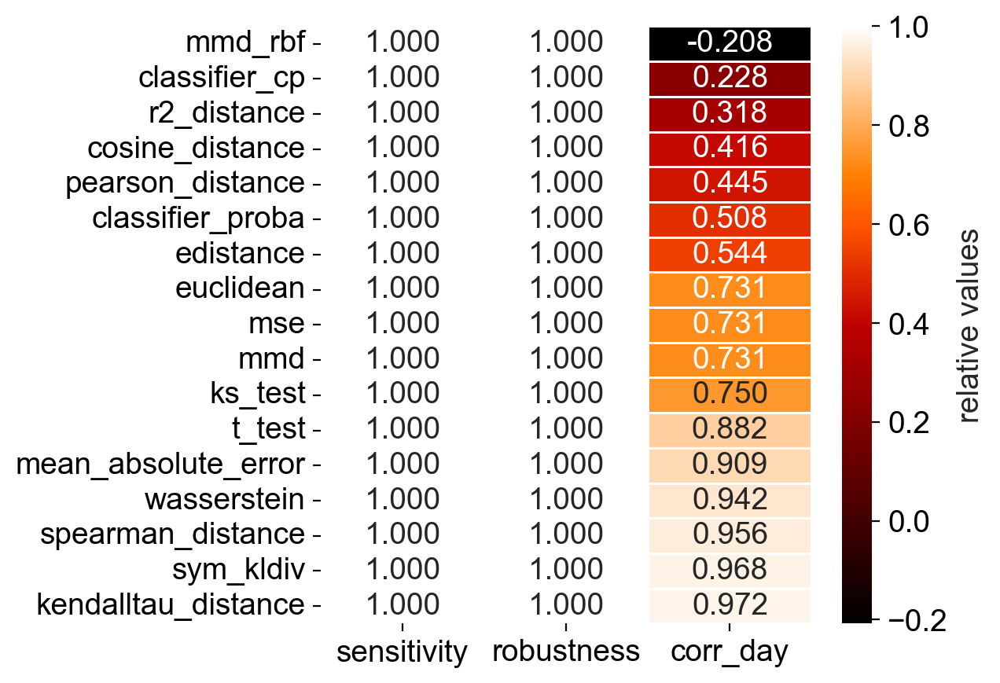

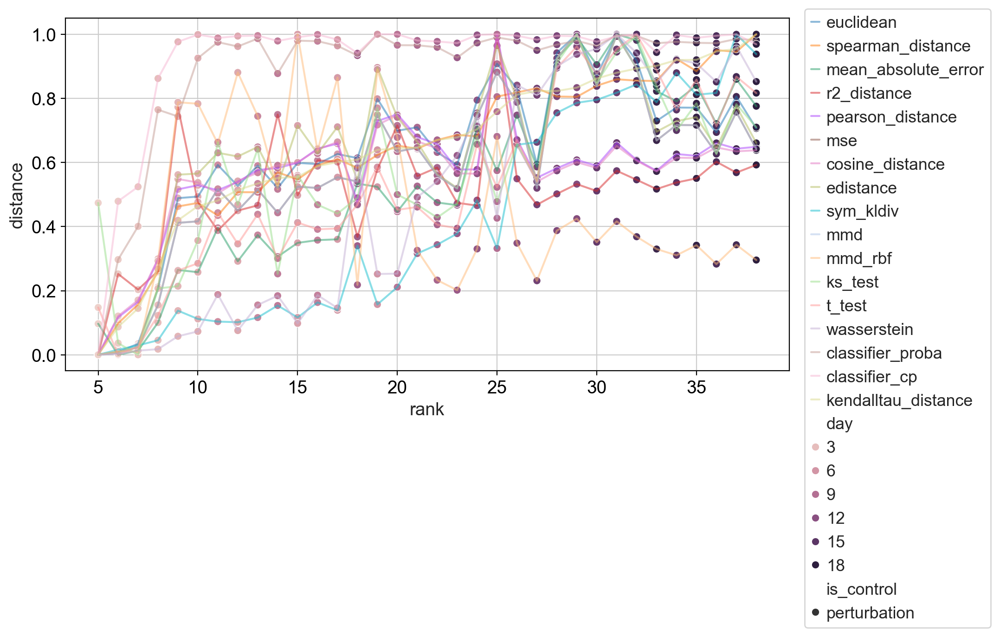

In [14]:
performances['schiebinger'] = evaluate_on_dataset(results, annotate, 'day', 'kendalltau_distance')

## satinha

In [15]:
%%time
with open(f'{dss_path}/satinha_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 11 ms, sys: 3.04 ms, total: 14 ms
Wall time: 63 ms


Don't think we have a source of ground truth in this dataset...

In [16]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = 1

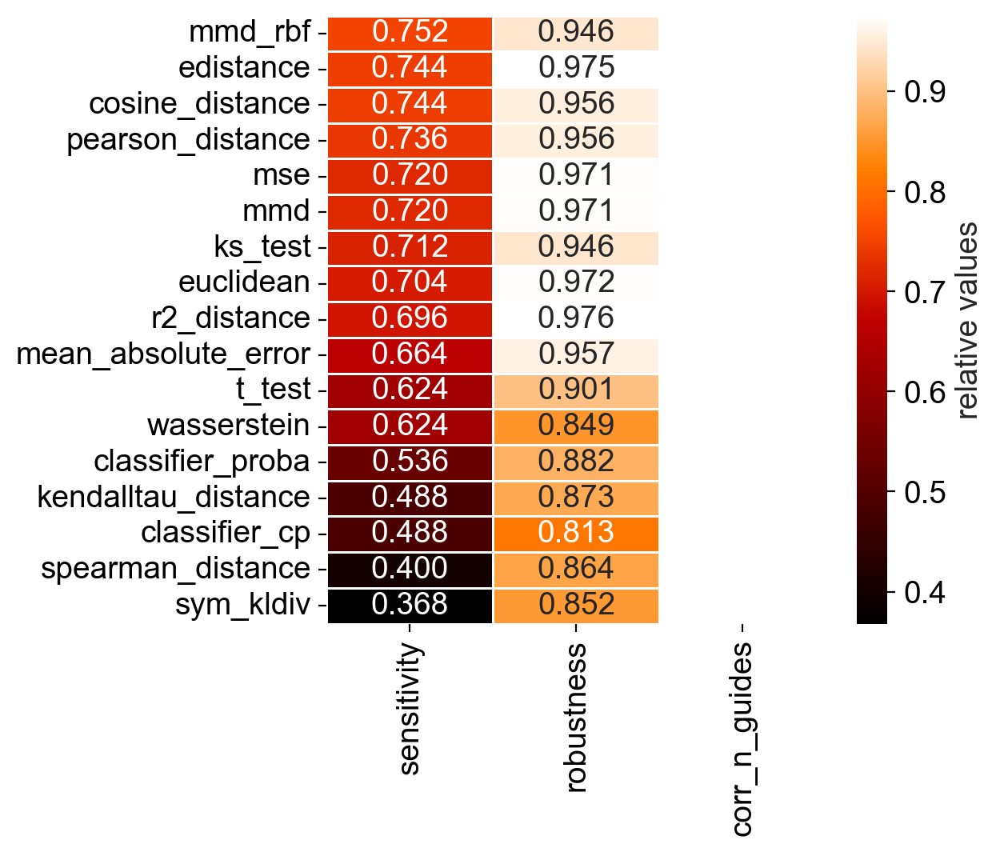

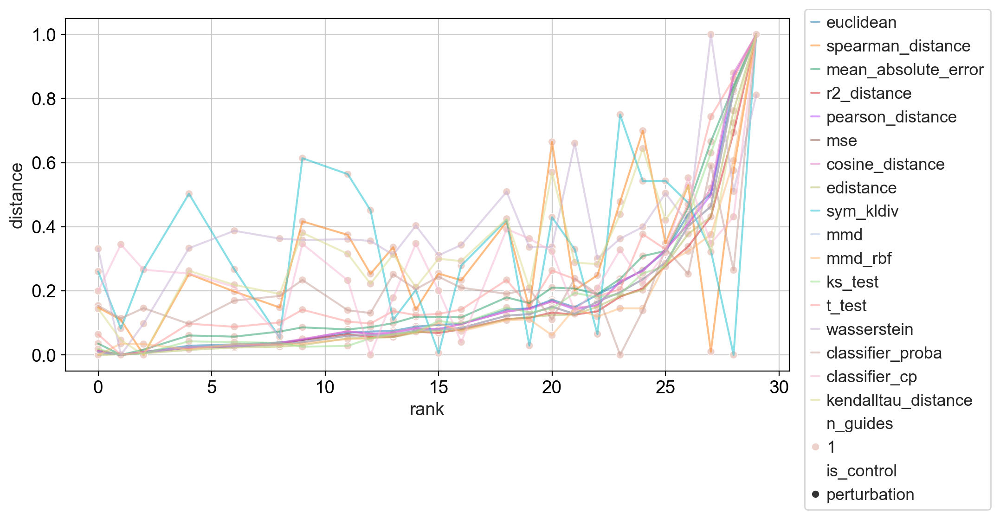

In [17]:
performances['satinha'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## norman

In [18]:
%%time
with open(f'{dss_path}/norman_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 9.31 ms, sys: 3.11 ms, total: 12.4 ms
Wall time: 124 ms


In [19]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = [int(s.count('+'))+1 for s in df.perturbation]

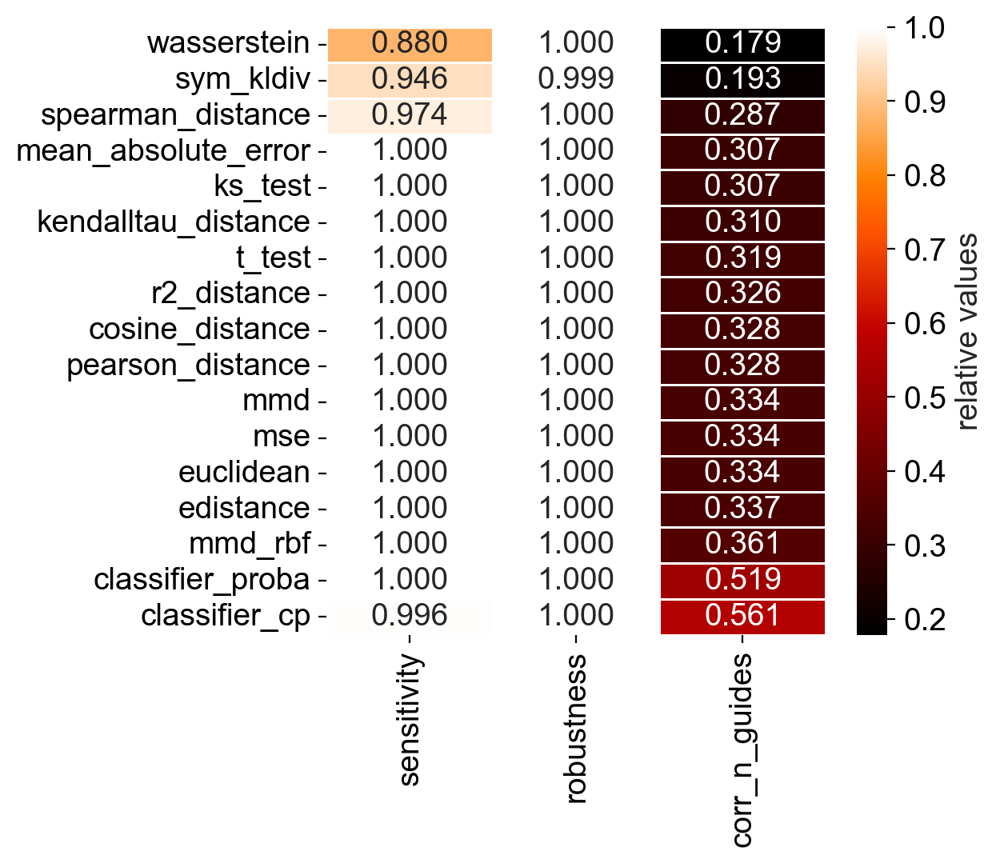

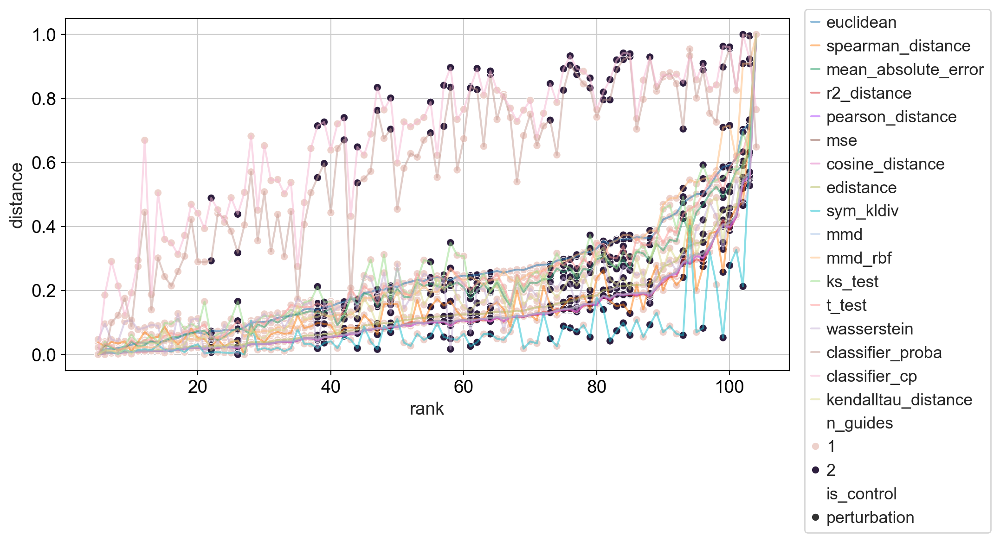

In [20]:
performances['norman'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## sciplex

In [21]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

### MCF7

In [22]:
%%time
with open(f'{dss_path}/spMCF7_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['2000-lognorm-n_genes', '1000-lognorm-n_genes'])
CPU times: user 13 ms, sys: 7.63 ms, total: 20.6 ms
Wall time: 235 ms


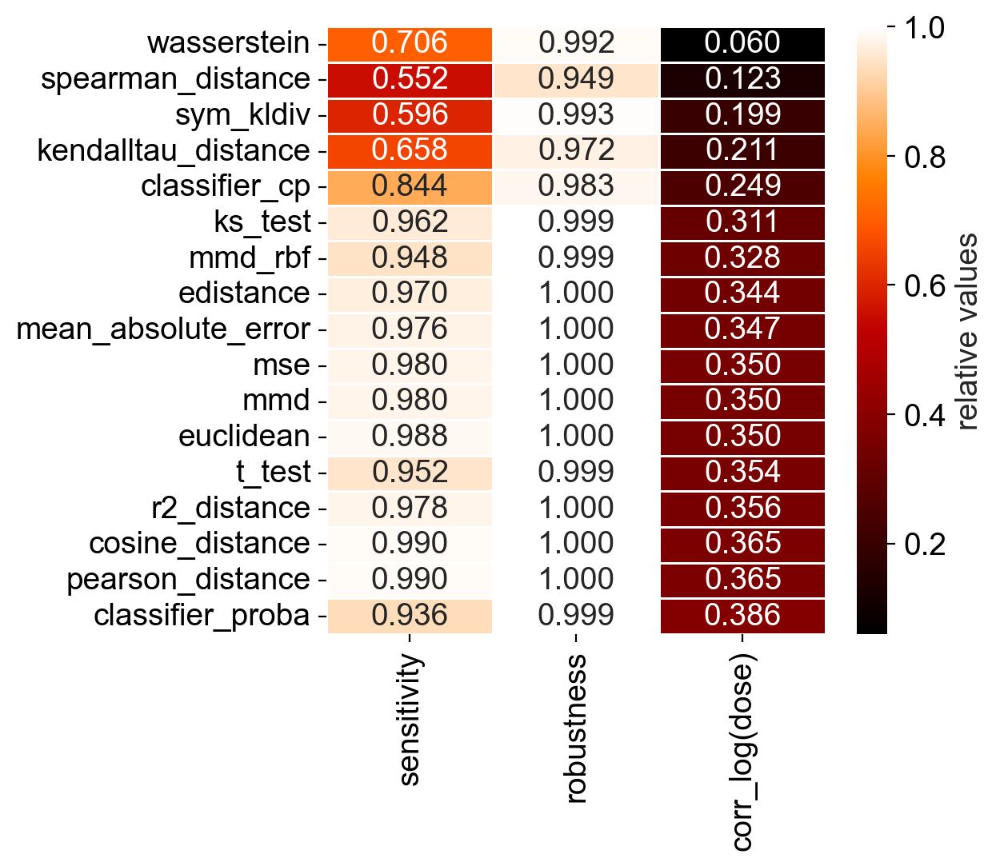

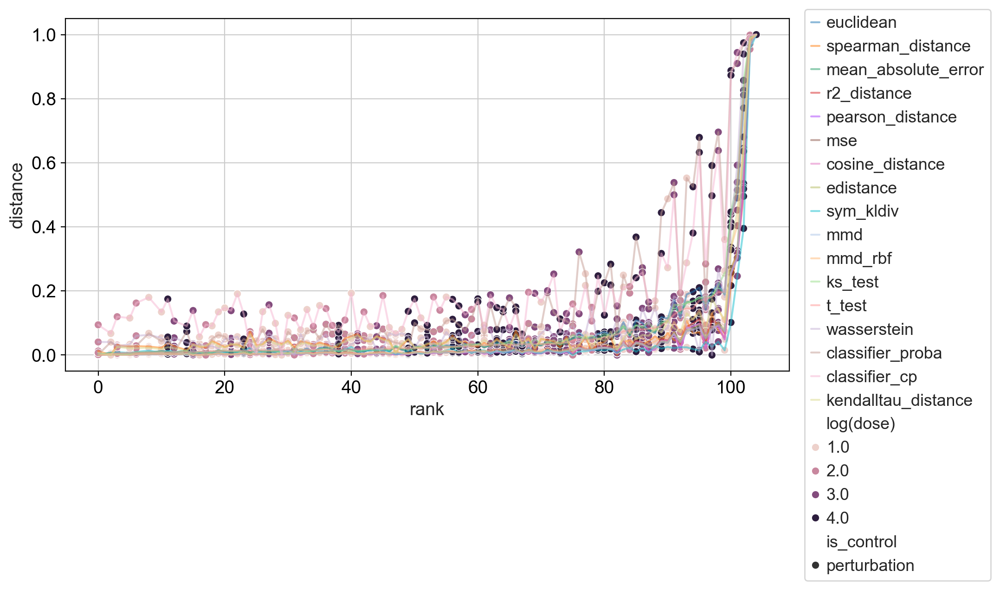

In [23]:
performances['sciplex_MCF7'] = evaluate_on_dataset(results, annotate, 'log(dose)', 't_test')

### A549

In [24]:
%%time
with open(f'{dss_path}/spA549_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 14.1 ms, sys: 9.51 ms, total: 23.6 ms
Wall time: 141 ms


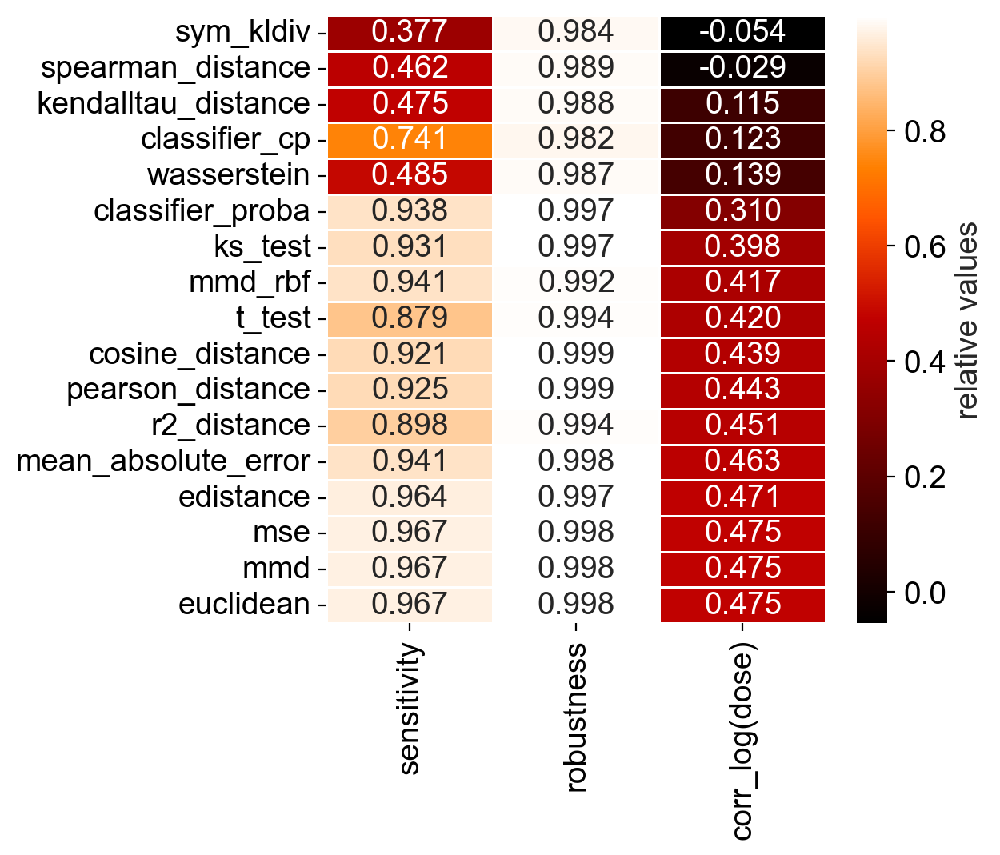

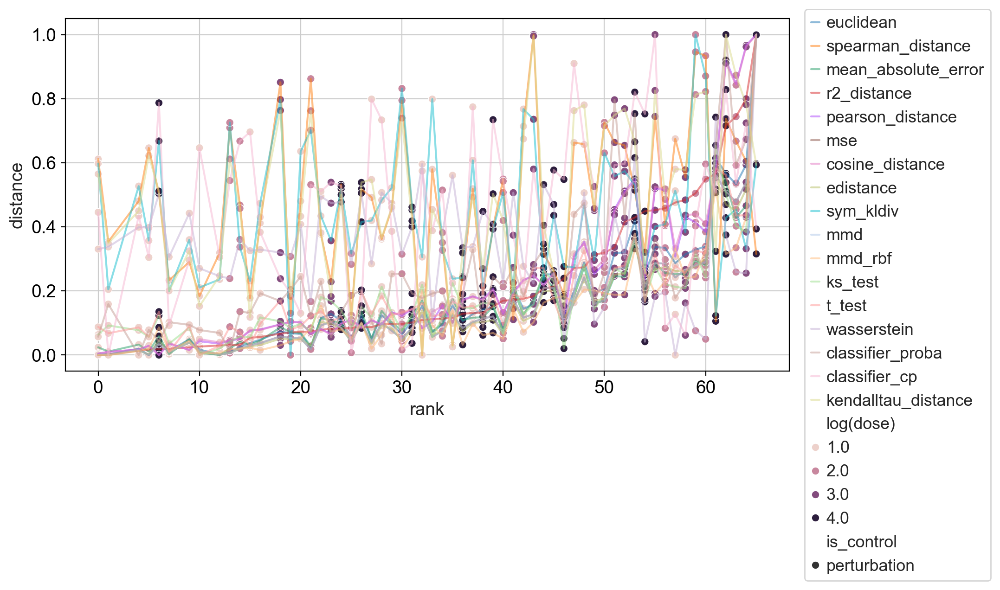

In [25]:
performances['sciplex_A549'] = evaluate_on_dataset(results, annotate, 'log(dose)', 'r2_distance')

### K562

In [26]:
%%time
with open(f'{dss_path}/spK562_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['2000-lognorm-n_genes', '1000-lognorm-n_genes'])
CPU times: user 10.6 ms, sys: 3.48 ms, total: 14 ms
Wall time: 110 ms


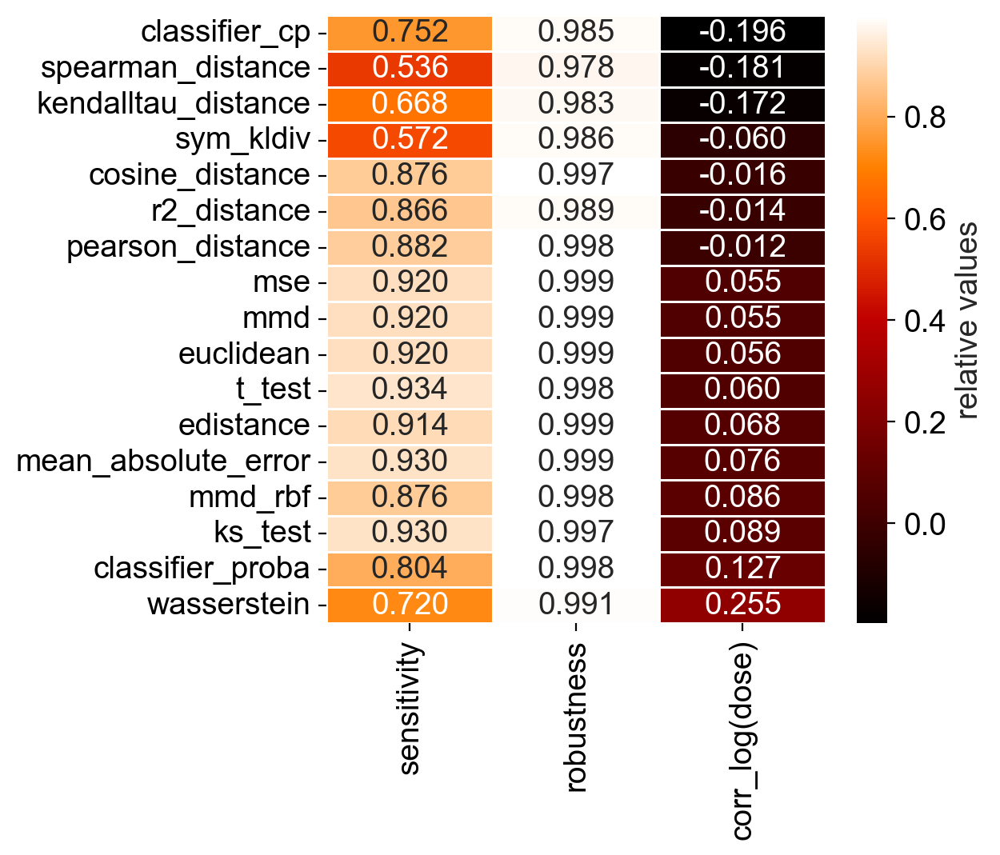

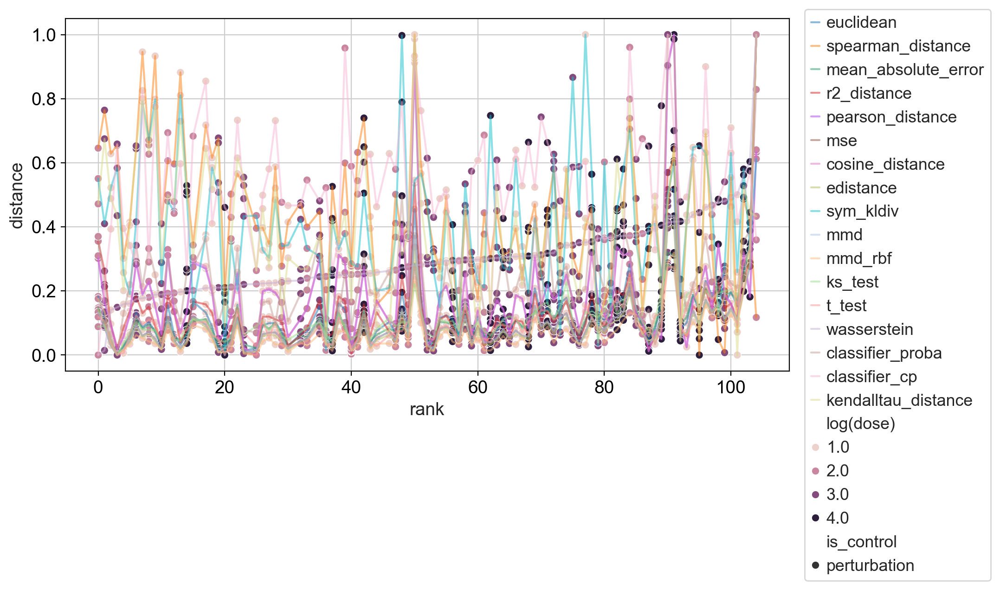

In [27]:
performances['sciplex_K562']  = evaluate_on_dataset(results, annotate, 'log(dose)', 'wasserstein')

## tahoe

In [28]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

### A549

In [29]:
%%time
with open(f'{dss_path}/tahoe_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['2000-lognorm-n_genes', '1000-lognorm-n_genes'])
CPU times: user 12.4 ms, sys: 5.9 ms, total: 18.3 ms
Wall time: 81 ms


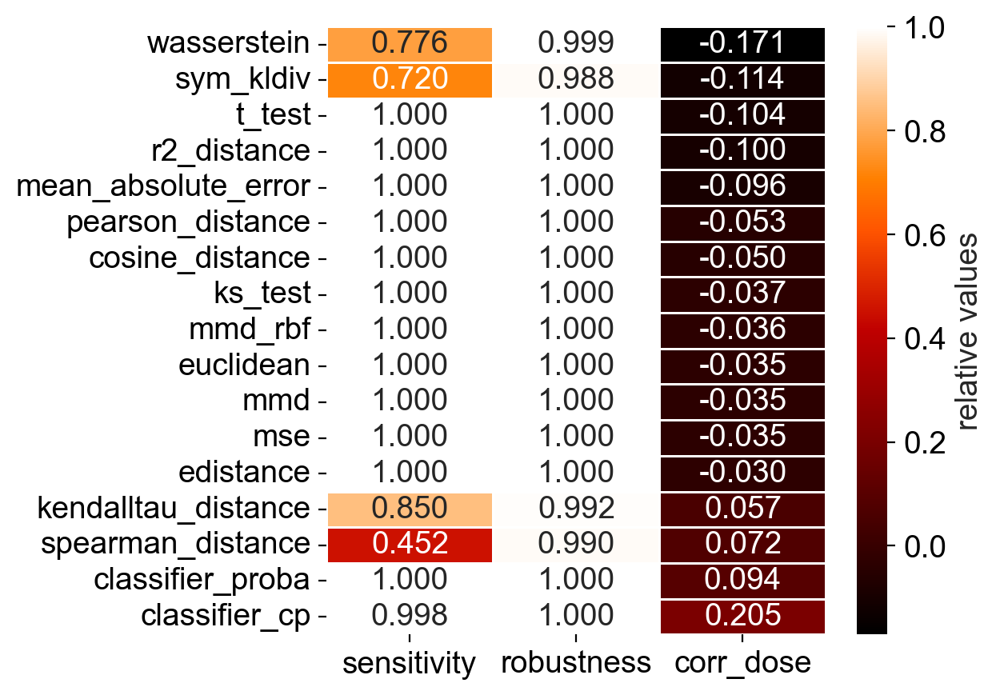

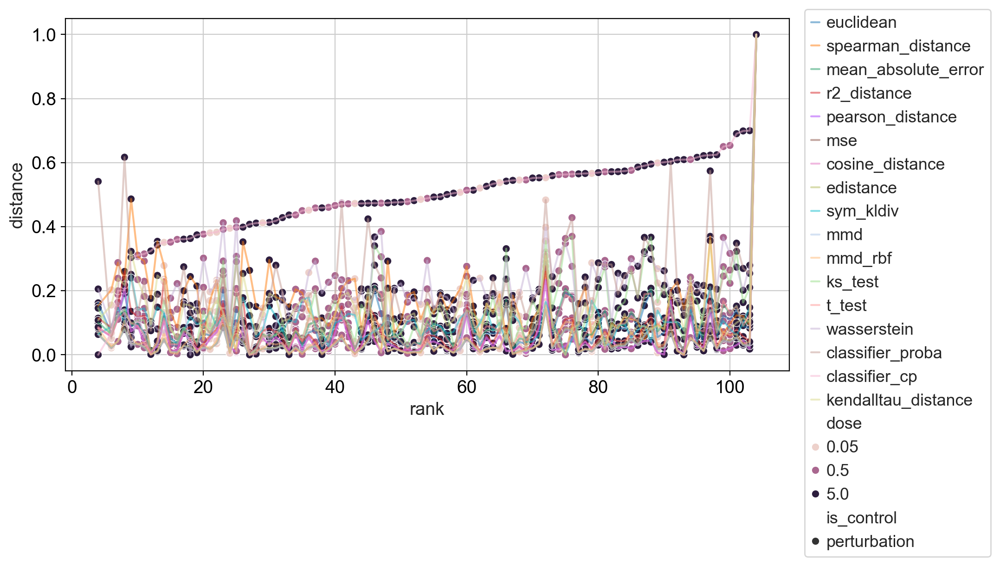

In [30]:
performances['tahoeA549'] = evaluate_on_dataset(results, annotate, 'dose', 'classifier_cp')

### HT29

In [31]:
%%time
with open(f'{dss_path}/tahoeHT29_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['2000-lognorm-n_genes', '1000-lognorm-n_genes'])
CPU times: user 9.68 ms, sys: 4.87 ms, total: 14.5 ms
Wall time: 102 ms


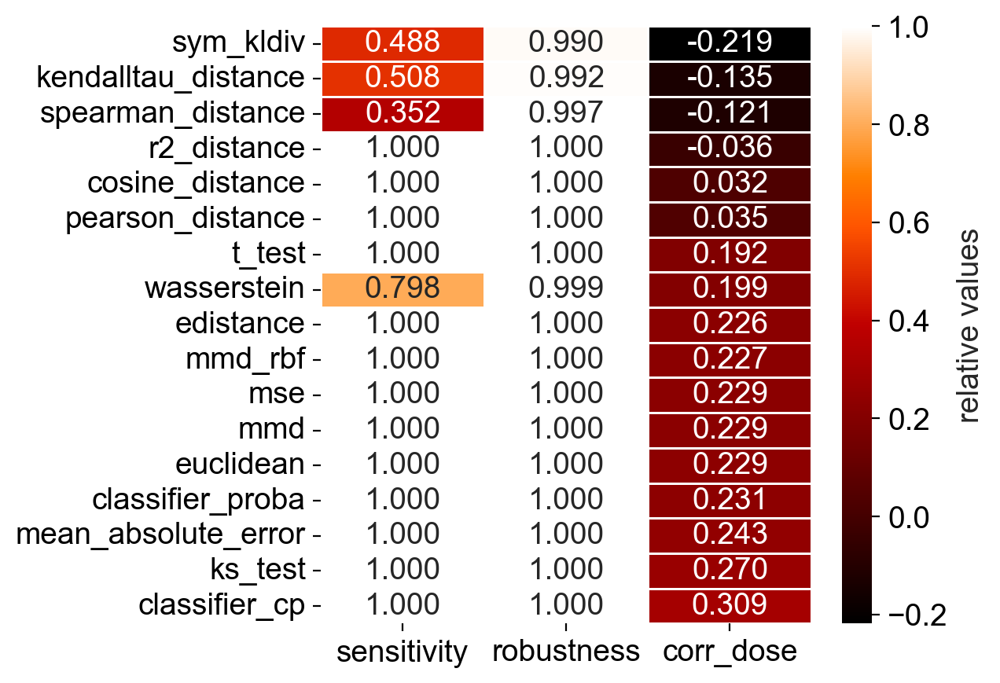

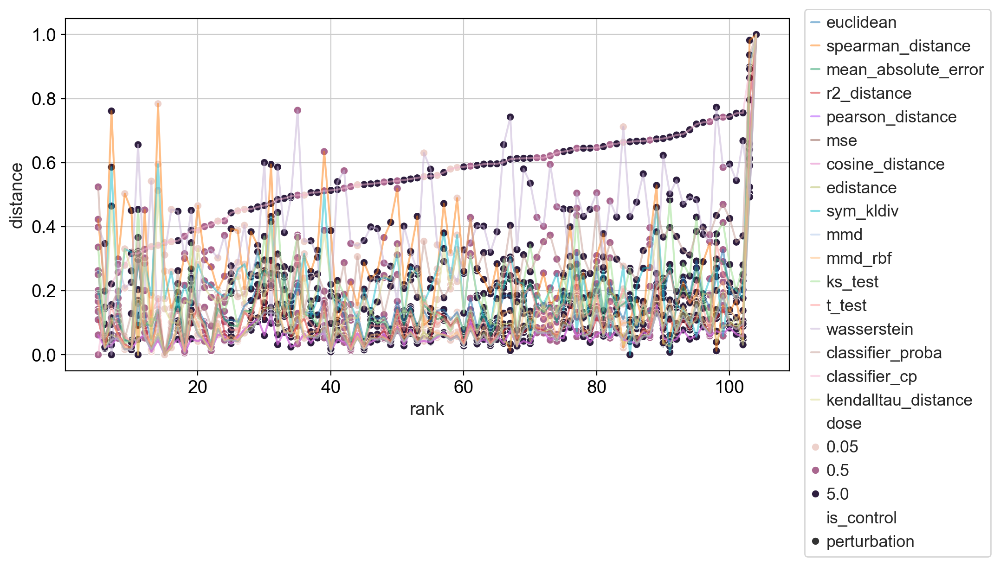

In [32]:
performances['tahoeHT29'] = evaluate_on_dataset(results, annotate, 'dose', 'classifier_cp')

### BT474

In [33]:
%%time
with open(f'{dss_path}/tahoeBT474_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 11.1 ms, sys: 3.58 ms, total: 14.7 ms
Wall time: 92.8 ms


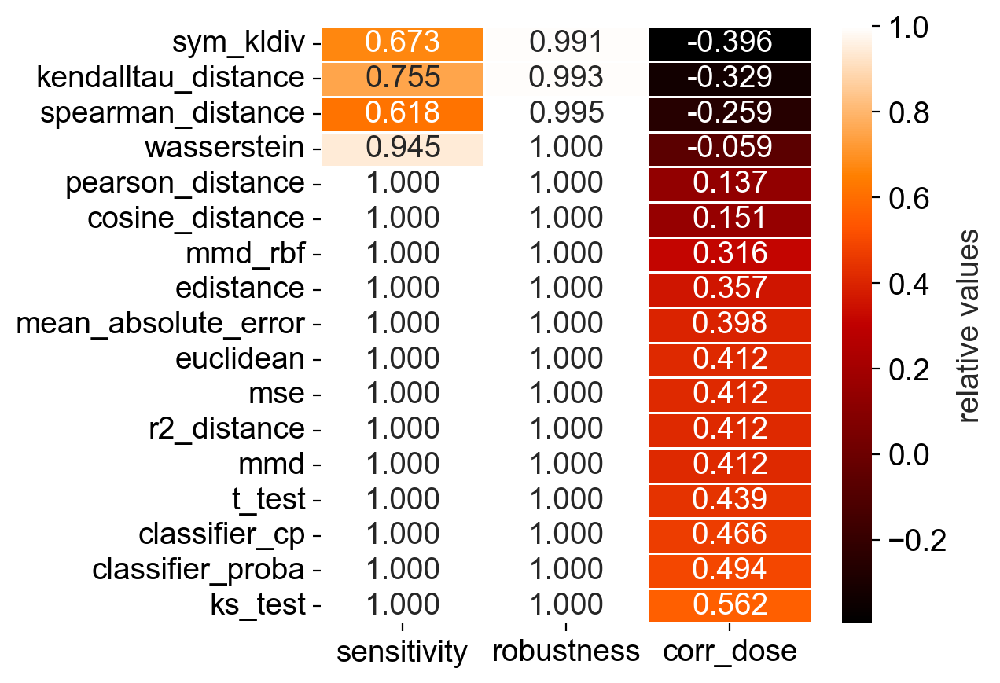

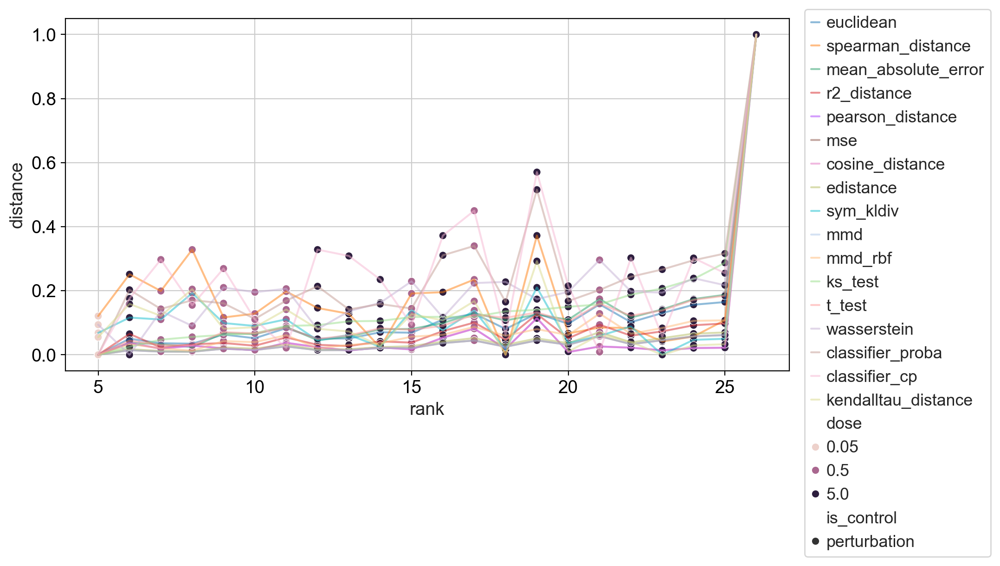

In [34]:
performances['tahoeBT474'] = evaluate_on_dataset(results, annotate, 'dose', 'ks_test')

## mcfarland

In [35]:
%%time
with open(f'{dss_path}/mcfarland_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 7.07 ms, sys: 2.98 ms, total: 10.1 ms
Wall time: 48 ms


In [36]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['time'] = [0 if 'control' in p else p.split('_')[1] for p in df.perturbation]

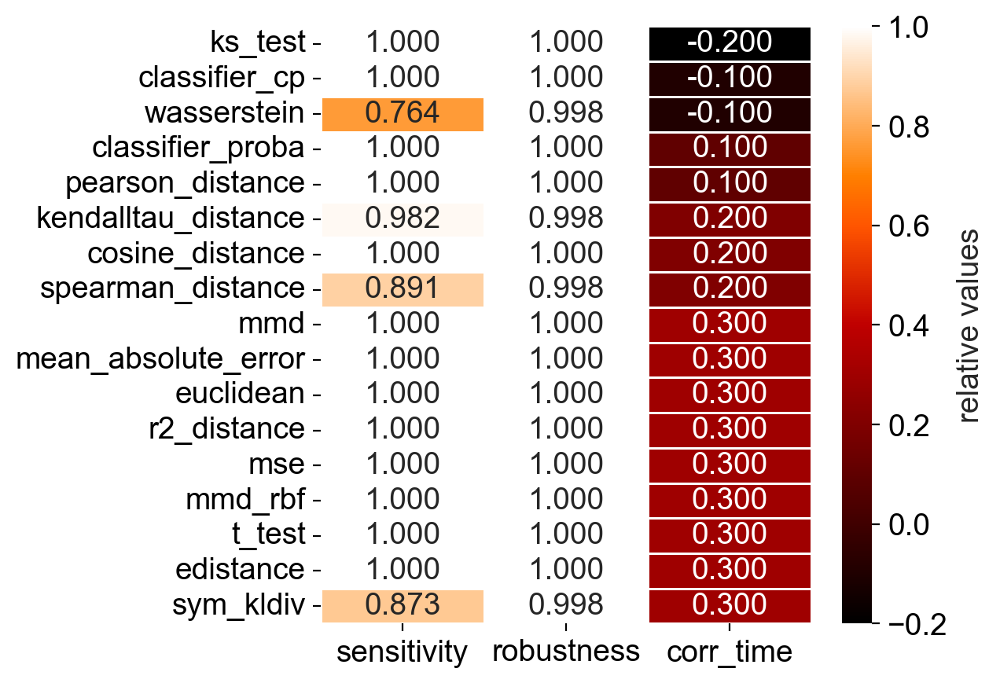

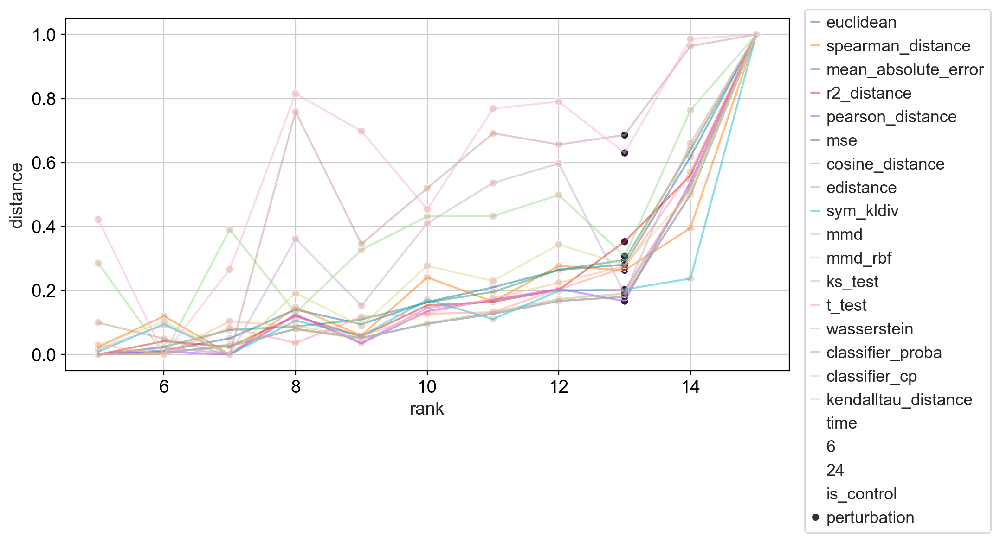

In [37]:
performances['mcfarland'] = evaluate_on_dataset(results, annotate, 'time', 'mean_absolute_error')

## saunders (not added to overall)

In [38]:
%%time
with open(f'/lustre/scratch/users/yuge.ji/metrics_revisions/saunders_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['209-lognorm-n_genes'])
CPU times: user 8.52 ms, sys: 2.87 ms, total: 11.4 ms
Wall time: 56.7 ms


In [39]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = 1

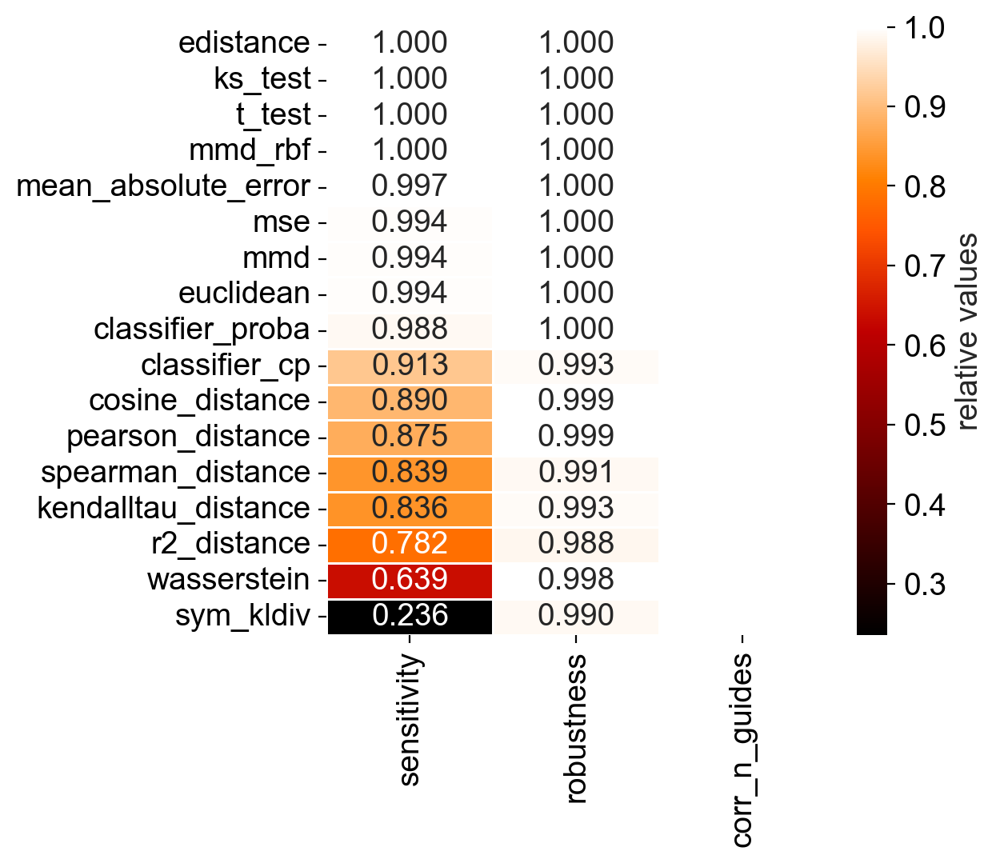

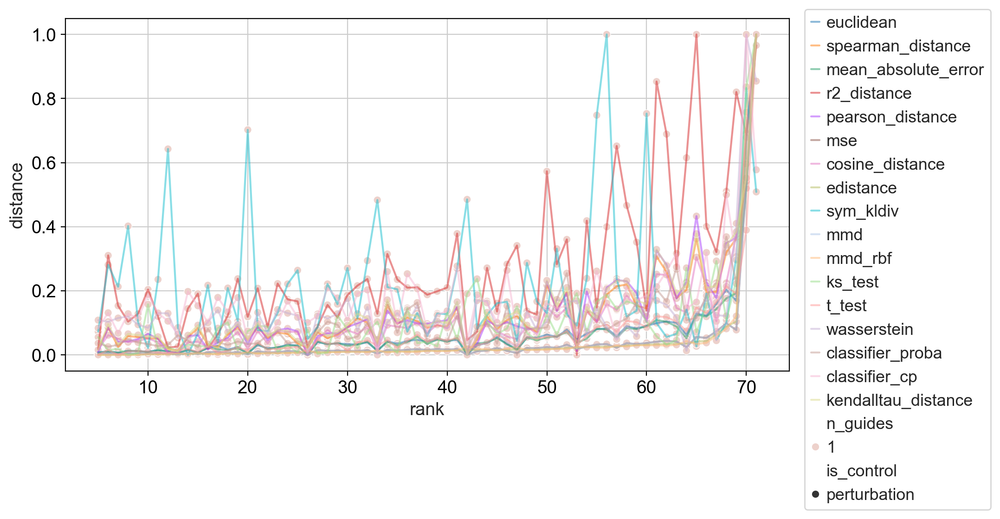

In [40]:
evaluate_on_dataset(results, annotate, 'n_guides', 'edistance', numeric_value='209');  # note: not added to performances

## summary

In [41]:
dfs = []
for k, df in performances.items():
    sdf = df.add_suffix(f'_{k}')
    dfs.append(sdf)

In [42]:
df = pd.concat(dfs, axis=1)

Drop any columns that are completely empty because evaluation wasn't possible.

In [43]:
df = df.dropna(axis=1, how='all')

Rename the distance metrics for consistency for publication.

In [44]:
df.index = [' '.join(x.split('_')) for x in df.index]
df = df.rename({
    'euclidean':'Euclidean',
    'mse':'MSE',
    'mmd':'MMD linear',
    'mmd rbf': 'MMD RBF',
    'edistance':'E-distance',
    'pearson distance': 'Pearson',
    't test': 'T-test',
    'r2 distance': 'R2',
    'ks test': 'KS statistic',
    'kendalltau distance': 'Kendall tau distance',
    'spearman distance': 'Spearman',
    'classifier cp': 'classifier class projection',
    'wasserstein':'Wasserstein',
    'sym kldiv':'symmetric KL div.'
})

Many of the plots will use scaled values. Also calculate the final ranking using the avg.

In [45]:
ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
ndf = ndf.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
ndf.mean(axis=1)

MSE                            0.906460
MMD linear                     0.906241
Euclidean                      0.905908
mean absolute error            0.902508
E-distance                     0.897898
T-test                         0.868943
classifier proba               0.867067
KS statistic                   0.861551
cosine distance                0.856085
Pearson                        0.849635
R2                             0.830545
MMD RBF                        0.828131
classifier class projection    0.713775
Wasserstein                    0.512647
Kendall tau distance           0.500682
Spearman                       0.355915
symmetric KL div.              0.238294
dtype: float64

Standardize the order of the dataframe and save.

In [46]:
df = df.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
df.to_csv('./figures/results_table_final.csv')

## Plot final table

In [47]:
sc.set_figure_params(dpi=100, frameon=False, facecolor=None, transparent=True, ipython_format='svg', vector_friendly=False)
plt.rcParams['svg.fonttype'] = 'none'

In [48]:
df = pd.read_csv('./figures/results_table_final.csv', index_col=0)  # old one was in just plain `results_table`
ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
ndf = ndf.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
original_df = df.copy()  # use this only to get the original column names

In [49]:
types = {
    'E-distance':'II',
    'Euclidean':'Ia',
    'KS statistic':'Ia',
    'Kendall tau distance':'III',
    'MMD linear':'Ia',
    'MSE':'Ia',
    'Pearson':'II',
    'R2':'II',
    'Spearman':'III',
    'T-test':'Ib',
    'Wasserstein':'III',
    'classifier class projection':'-',
    'classifier proba':'-',
    'MMD RBF':'II',
    'cosine distance':'II',
    'mean absolute error':'Ib',
    'symmetric KL div.':'III',
}

type_to_rank = {
    'Ia': 1,
    'Ib': 2,
    'II': 3,
    'III': 4,
}

color_dict = {
    'simulated':'grey',
    'garcia':'orange',
    'schiebinger':'salmon',
    'satinha':'yellowgreen',
    'norman':'darkgreen',
    'MCF7':'lightblue',
    'A549':'steelblue',
    'K562':'blue',
    'tahoeA549':'lavender',
    'tahoeHT29':'purple',
    'tahoeBT474':'mediumorchid',
    'mcfarland':'darkblue',
}

trio = ['indianred', 'darkseagreen', 'thistle']
cmap = 'bone'
bar_color = 'lightslategrey'

def xtick_off(ax):
    ax.set_xticklabels([])
    ax.set_xticks([])

def ytick_off(ax):
    ax.set_yticklabels([])
    ax.set_yticks([])
    
def add_type(df):
    df['type'] = df.index.map(types)
    return df

def plt_bar(df, title=None, cmap='twilight'):
    plt.figure(facecolor='none')
    sns.barplot(x=df.index, y=0, hue="type", data=df, palette=cmap, dodge=False)
    plt.gca().axis('off')
    plt.grid(None)
    plt.title(title)

<Figure size 2400x600 with 0 Axes>

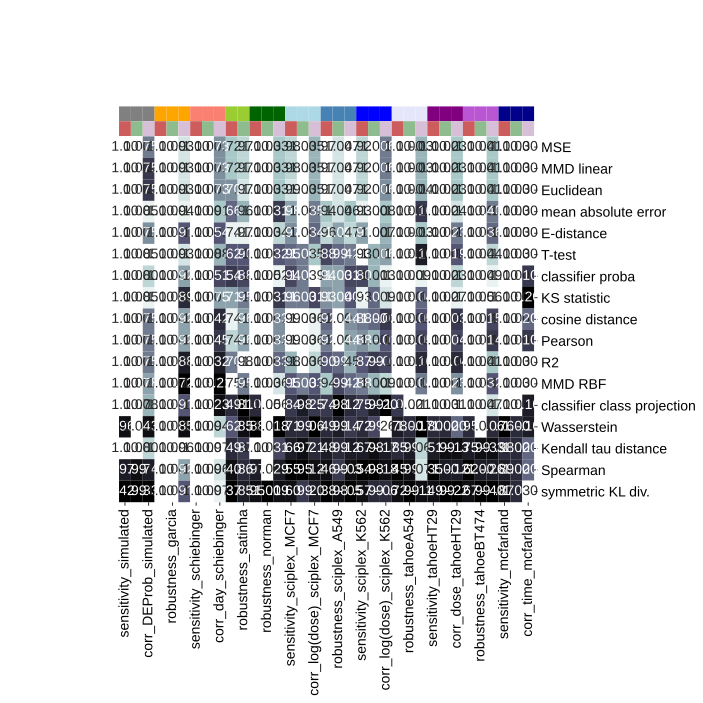

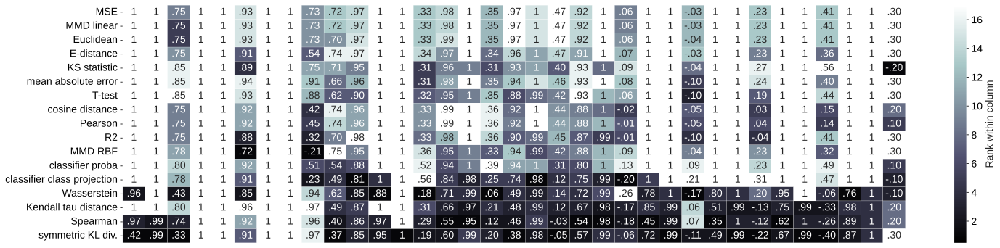

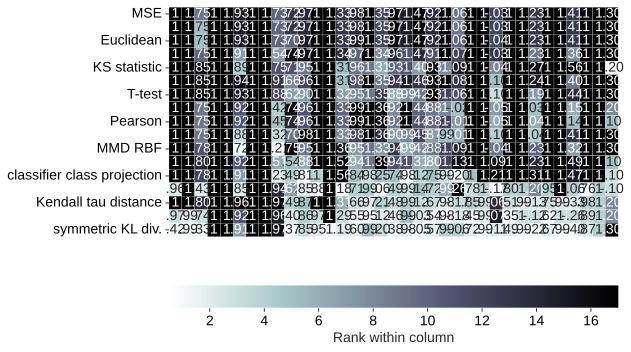

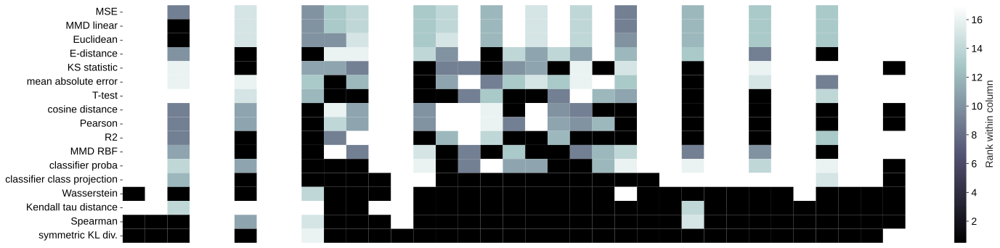

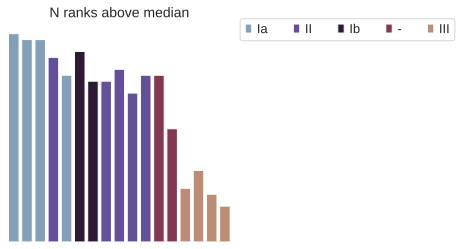

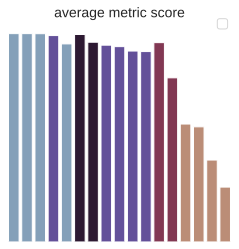

In [50]:
main_plot_df = df.copy()
main_plot_df = main_plot_df.fillna(0)

plt.figure(figsize=(24, 6))
# just for the col color
col_color_dataset = [color_dict[c.split('_')[-1]] for c in df.columns]
col_color_task = trio*3 + trio[:2] + trio*8
sns.clustermap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".")),
    cmap=cmap, fmt = '', cbar_kws={'label': 'Rank within column'},
    row_cluster=False, col_cluster=False, col_colors=[col_color_dataset, col_color_task],
    cbar_pos=None
)
# plt.savefig('./figures/mainfig_labelbar.svg')

# processing
main_plot_df.columns = ['_'.join(c.split('_')[:2]) for c in main_plot_df.columns]
main_plot_df = main_plot_df.rename(columns={'rank_mean':'CRP', 'rank_var*100':'robustness'})
halfway = 8
rank_df = main_plot_df.round(3).rank(method='max').clip(lower=halfway)

order = ['MSE', 'MMD linear', 'Euclidean', 'E-distance', 'KS statistic',  # type I
    'mean absolute error', 'T-test',  # Ib
    'cosine distance', 'Pearson', 'R2', 'MMD RBF',  # II
    'classifier proba', 'classifier class projection',  # II - classification
    'Wasserstein', 'Kendall tau distance', 'Spearman', 'symmetric KL div.',   # III
]

# getting order automatically
# bar_df = add_type(pd.DataFrame((rank_df > 8).sum(axis=1)))
# bar_df['rank'] = bar_df.type.map(type_to_rank)
# order = bar_df.sort_values(by='rank').index

main_plot_df = main_plot_df.loc[order]
rank_df = rank_df.loc[order]

# the actual plot
plt.figure(figsize=(24, 6))
ax = sns.heatmap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1")),
    cmap=cmap, linewidths=.2, fmt = '',
    cbar_kws={'label': 'Rank within column'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
# plt.savefig('./figures/mainfig_table.svg')
plt.show()

# just for the colorbar
plt.figure(figsize=(8, 6))
ax = sns.heatmap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1")),
    cmap=f'{cmap}_r', linewidths=.2, fmt = '',
    cbar_kws={'label': 'Rank within column', 'orientation': 'horizontal', 'location': 'bottom'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
# plt.savefig('./figures/mainfig_colorbar.svg')
plt.show()

# for the plot showing that MSE performs above average in all datasets
plt.figure(figsize=(24, 6))
ax = sns.heatmap(
    rank_df.replace(halfway, 0),
    cmap=cmap, cbar_kws={'label': 'Rank within column'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
# plt.savefig('./figures/mainfig_table_numberless.svg')
plt.show()

# pairs with the one without numbers
plt_bar(add_type(pd.DataFrame((rank_df > 8).sum(axis=1)).loc[order]), "N ranks above median")
plt.legend(bbox_to_anchor=(1.01, 1.05), ncol=5)
# plt.savefig('./figures/mainfig_nranks_sidebar.svg')
plt.show()

# pairs with the one with numbers
plt_bar(add_type(pd.DataFrame(ndf.mean(axis=1)).loc[order]), "average metric score")
plt.legend([], bbox_to_anchor=(1.01, 1.05))
# plt.savefig('./figures/mainfig_avgscore_sidebar.svg')
plt.show()

Make the legend

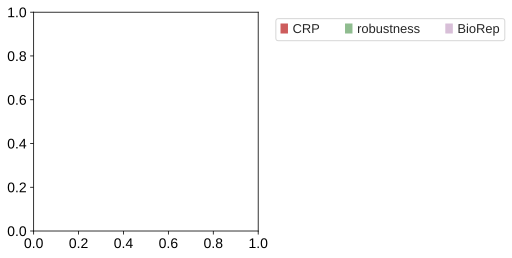

In [51]:
import matplotlib.patches as mpatches
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(trio, ['CRP', 'robustness', 'BioRep'])]

plt.legend(handles=patches, ncol=3, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(None)
# plt.savefig('./figures/mainfig_legend.svg')
plt.show()

In [52]:
def plot_sub(sub_df, cmap):
    sub_df = sub_df.loc[order]
    sub_df.columns = [c.split('_')[-1] for c in sub_df.columns]
    annot_df = sub_df.fillna(0)
    annot_df = annot_df.applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1"))
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        sub_df.round(3).rank(method='max'),
        annot=annot_df,
        cmap=cmap, linewidths=.5, fmt = '', cbar_kws={'label': 'Rank within column'}
    )
    plt.xticks(rotation=30, ha='right')
    plt.grid(None)
    plt.savefig(f'./figures/supp1_subres_{cmap}.svg')
    plt.show()
    
    bar_df = pd.DataFrame(sub_df.mean(axis=1))
    bar_df = add_type(bar_df)
    plt_bar(bar_df)
    plt.legend([], bbox_to_anchor=(1.01, 1.05))
    plt.ylim(.26)
    plt.savefig(f'./figures/supp1_subresbar_{cmap}.svg')
    plt.show()

    print(sub_df.mean())
    print('mean all:', sub_df.mean().mean())
    return sub_df

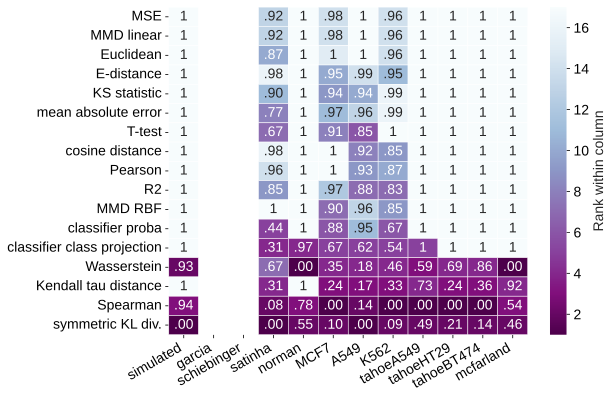

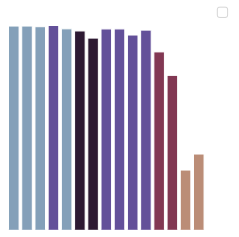

simulated      0.933613
garcia              NaN
schiebinger         NaN
satinha        0.683824
norman         0.900000
MCF7           0.755036
A549           0.734641
K562           0.725392
tahoeA549      0.870760
tahoeHT29      0.831699
tahoeBT474     0.844538
mcfarland      0.877828
dtype: float64
mean all: 0.8157330621604044
average: 0.8157330621604044
std: nan


In [53]:
# for a dataset-averaged plot
sub_dfs = []

cols = [c for c in ndf.columns if 'sensitivity' in c]
sub_df = plot_sub(ndf[cols], 'BuPu_r')
sub_dfs.append(sub_df)
print('average:', sub_df.mean().mean())
print('std:', sub_df.values.flatten().std())

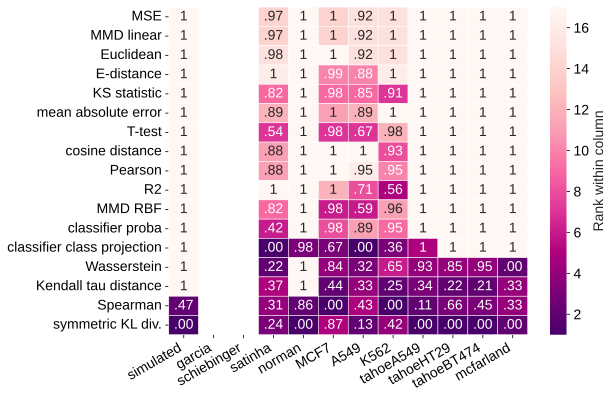

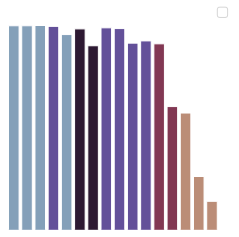

simulated      0.909804
garcia              NaN
schiebinger         NaN
satinha        0.665796
norman         0.931526
MCF7           0.866576
A549           0.669960
K562           0.758832
tahoeA549      0.845740
tahoeHT29      0.866516
tahoeBT474     0.859944
mcfarland      0.803922
dtype: float64
mean all: 0.8178615176522313
average: 0.8178615176522313
std: 0.31369017741657435


In [54]:
cols = [c for c in ndf.columns if 'robustness' in c]
sub_df = plot_sub(ndf[cols], 'RdPu_r')
sub_dfs.append(sub_df)
print('average:', sub_df.mean().mean())
print('std:', np.nanstd(sub_df.values.flatten()))

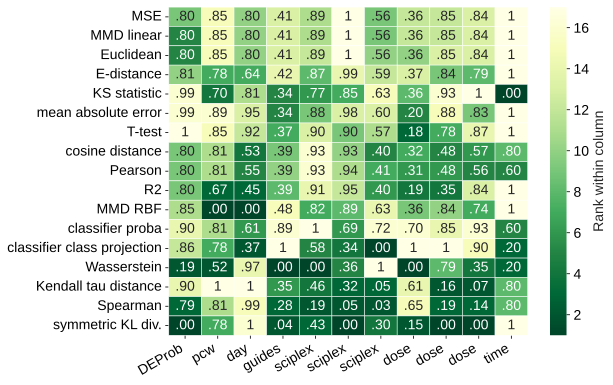

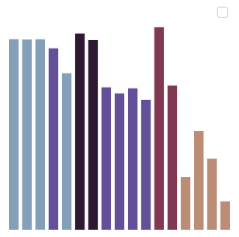

DEProb     0.769108
pcw        0.751634
day        0.715676
guides     0.404844
sciplex    0.726738
sciplex    0.717476
sciplex    0.470869
dose       0.381169
dose       0.653261
dose       0.653916
time       0.764706
dtype: float64
mean all: 0.6372178550468822
average: 0.6372178550468822
std: 0.3104873354660762


In [55]:
cols = [c for c in ndf.columns if 'sens' not in c and 'robu' not in c]
sub = ndf[cols]
sub.columns = ['_'.join(c.split('_')[:-1]) for c in sub.columns]
sub_df = plot_sub(sub, 'YlGn_r')
sub_dfs.append(sub_df)
print('average:', sub_df.mean().mean())
print('std:', sub_df.values.flatten().std())

Summarized across datasets, per evaluation measure:

In [56]:
def per_eval_pointplot(df, figsize=(4, 6)):
    df = df.round(3)
    df = df.reset_index(names='distance').melt(id_vars='distance', var_name='criterion', value_name='score')

    plt.figure(figsize=figsize)
    sns.pointplot(
        data=df,
        x="score",
        y="distance",
        hue="criterion",
        hue_order=['PDR', 'Robustness', 'BioRep'],
        join=False,
        markers=['o', 's', 'D'],
        markerfacecolor='none',
    )
    plt.xlabel('z-normalized per evaluation measure score')

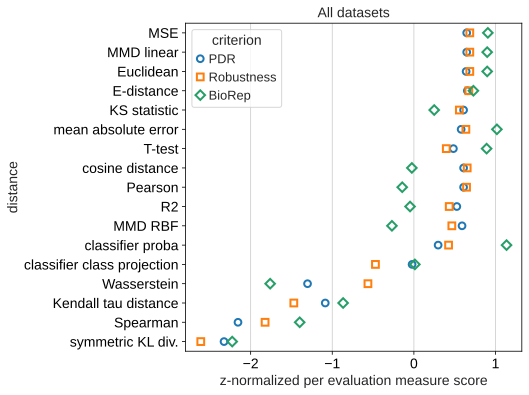

In [57]:
summary_df = pd.concat([df.mean(axis=1) for df in sub_dfs], axis=1).set_axis(['PDR', 'Robustness', 'BioRep'], axis=1)
summary_df = summary_df.round(3)
df = (summary_df - summary_df.mean()) / summary_df.std(ddof=0)

per_eval_pointplot(df, figsize=(6, 6))
plt.title('All datasets')
plt.savefig('./figures/mainfig_dotplot.svg')

Summarized across types:

In [58]:
dataset_types = {
    'simulated':'simulated',
    'garcia':'time course',
    'schiebinger':'time course',
    'satinha':'CRISPR',
    'norman':'CRISPR',
    'MCF7':'small molecule',
    'A549':'small molecule',
    'K562':'small molecule',
    'tahoeA549':'small molecule',
    'tahoeHT29':'small molecule',
    'tahoeBT474':'small molecule',
    'mcfarland':'small molecule',
}

rounded_df = main_plot_df.round(3).copy()
summary_df = (rounded_df - rounded_df.mean()) / rounded_df.std(ddof=0)
summary_df = summary_df.fillna(0)  # if all values were the same, set to the center at 0
summary_df.columns = original_df.columns.copy()  # reset the column names so they have the dataset name in them
summary_df = summary_df.round(3)  # matches above visual

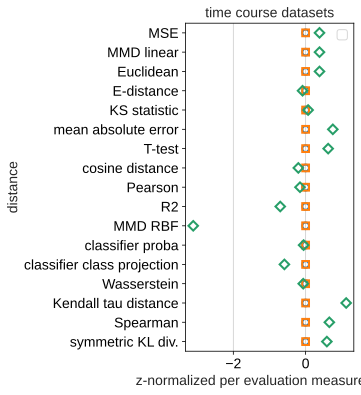

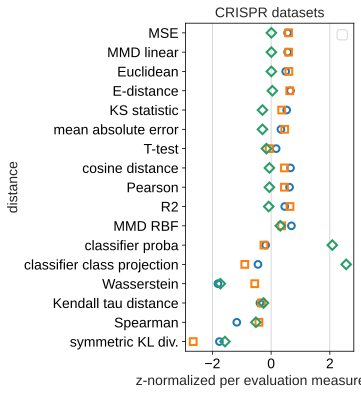

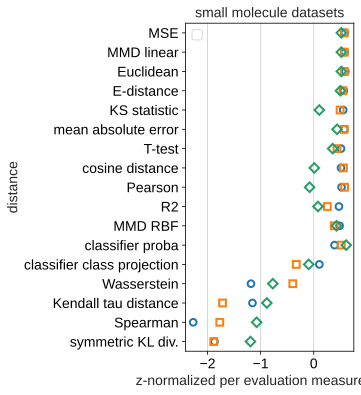

In [59]:
for mode in ['time course', 'CRISPR', 'small molecule']:
    df = summary_df.loc[:,
        summary_df.columns.str.split('_').str[-1].map(dataset_types) == mode
    ]
    df = df.groupby(df.columns.str.split('_').str[0], axis=1).mean()
    df.columns = df.columns.map({'corr':'BioRep', 'robustness':'Robustness', 'sensitivity':'PDR'})

    per_eval_pointplot(df, figsize=(3, 6))
    plt.legend('')
    plt.title(f'{mode} datasets')
    plt.savefig(f'./figures/pointplot_{mode}.svg')

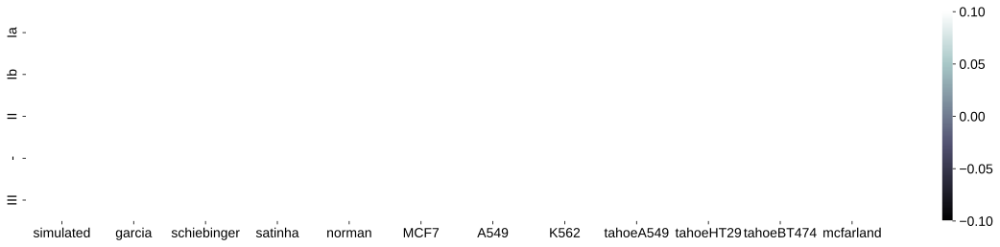

In [60]:
# adjust plotting order (unused)
df = df.reindex(['Ia', 'Ib', 'II', '-', 'III'])
df = df.reindex(list(color_dict.keys()), axis=1)

plt.figure(figsize=(20, 4))
ax = sns.heatmap(df, cmap=cmap)
# xtick_off(ax)
plt.grid(None)

## cluster metrics based on performance

In [61]:
import anndata as ad

In [62]:
types_pca = {
    'E-distance':'ii',
    'Euclidean':'ia',
    'KS statistic':'ia',
    'Kendall tau distance':'iii',
    'MMD linear':'ia',
    'MMD RBF':'ii',
    'MSE':'ia',
    'Pearson':'ii',
    'R2':'ii',
    'cosine distance':'ii',
    'classifier proba':'ii',
    'Spearman':'iii',
    'T-test':'ib',
    'Wasserstein':'iii',
    'classifier class projection':'ii',
    'mean absolute error':'ib',
    'symmetric KL div.':'iii',
}

In [63]:
perf = ad.AnnData(main_plot_df)
perf.obs['method'] = main_plot_df.index.astype('category')
perf.obs['type'] = perf.obs.method.map(types_pca)
perf

AnnData object with n_obs × n_vars = 17 × 35
    obs: 'method', 'type'

In [64]:
sc.tl.pca(perf)
perf.obsm['X_pca'][:, 0] += np.random.normal(0, 0.01, perf.shape[0])  # Add jitter to the first component
perf.obsm['X_pca'][:, 1] += np.random.normal(0, 0.01, perf.shape[0])  # Add jitter to the second component

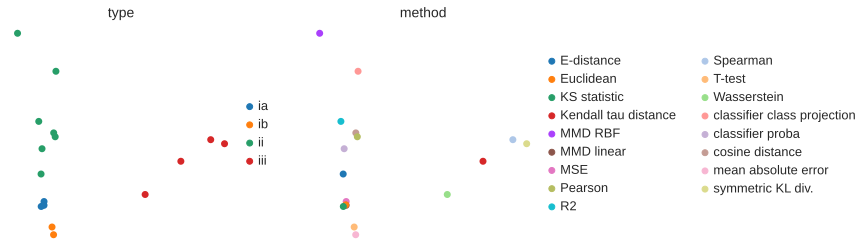

In [65]:
sc.pl.pca(perf, color=['type', 'method'], size=200, show=False)
plt.savefig('./figures/metric_pca.svg')